# Vector Calculus

Classical electrodynamics describes electromagnetic fields that vary in time and space.  To describe these variations, we use the mathematical framework of ***vector calculus***.  This means that we take derivatives and integrals of scalar and vector fields in three dimensions.  This notebook will introduce you to the most important operations of vector calculus in electrodynamics and give you some tools for visualizing the effect of these operations.

## Modules

A **module** is a collection of Python functions defined in a separate file.  This notebook uses a couple of custom modules: `Electrodynamics.py` and `VectorCalculus.py`.

Before we import them, find these files in your directory, open them, and inspect their contents.

- What are some of the functions defined in these modules?  What do they do?

From the VectorCalculus module, the grad, div, and curl functions perform the gradient, divergent and curl operators, respectively. From the Electrodynamics module, the draw_scalar_field and draw_vector_field plot and display their respective fields.

In [1]:
# Get access to useful functions.
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits import mplot3d

# Get access to custom functions.
import VectorCalculus as vc
import Electrodynamics as ed

from importlib import reload
reload(vc)
reload(ed)

<module 'Electrodynamics' from 'C:\\Users\\jdkob\\Documents\\PHY Elec & Mag\\electrodynamics\\week-02\\Electrodynamics.py'>

In [3]:
## Use this command to turn ON interactive plots:
%matplotlib notebook

## Use this command to turn OFF interactive plots.
# %matplotlib inline

Now that we have access to the functions, let's create an electric field, an electrostatic potential, and start exploring.

In [118]:
# Define coordinate grid.
num_points = 257
box_size = 5

# Store coordinate arrays.
X,Y,Z = ed.coordinates(L=box_size, N=num_points)

# Compute grid spacing.
ds = X[1,0,0] - X[0,0,0]

# Store grid and spacing in a single object for repeated use later.
grid = (X,Y,Z,ds)

# Define charge and location of two point charges.
Q1 = +1
x1 = -1
y1 = 0
z1 = 0
R1 = np.array([x1,y1,z1])

Q2 = -5
x2 = +1
y2 = 0
z2 = 0
R2 = np.array([x2,y2,z2])

# Compute the potential.
V  = ed.point_charge_potential(Q1, R1, X, Y, Z)
V += ed.point_charge_potential(Q2, R2, X, Y, Z)

# Compute the electric field.
E  = ed.point_charge_field(Q1, R1, X, Y, Z)
E += ed.point_charge_field(Q2, R2, X, Y, Z)

<IPython.core.display.Javascript object>


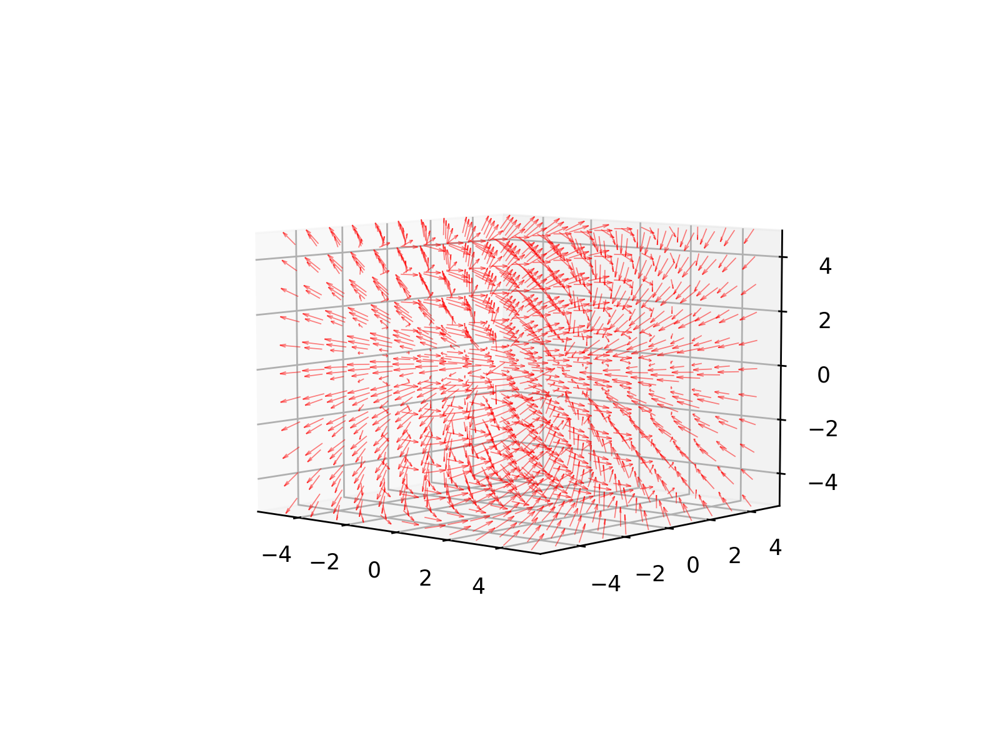

<Axes3DSubplot:>

In [5]:
# Draw the electric field.
ed.draw_vector_field(X,Y,Z,*E)

<IPython.core.display.Javascript object>


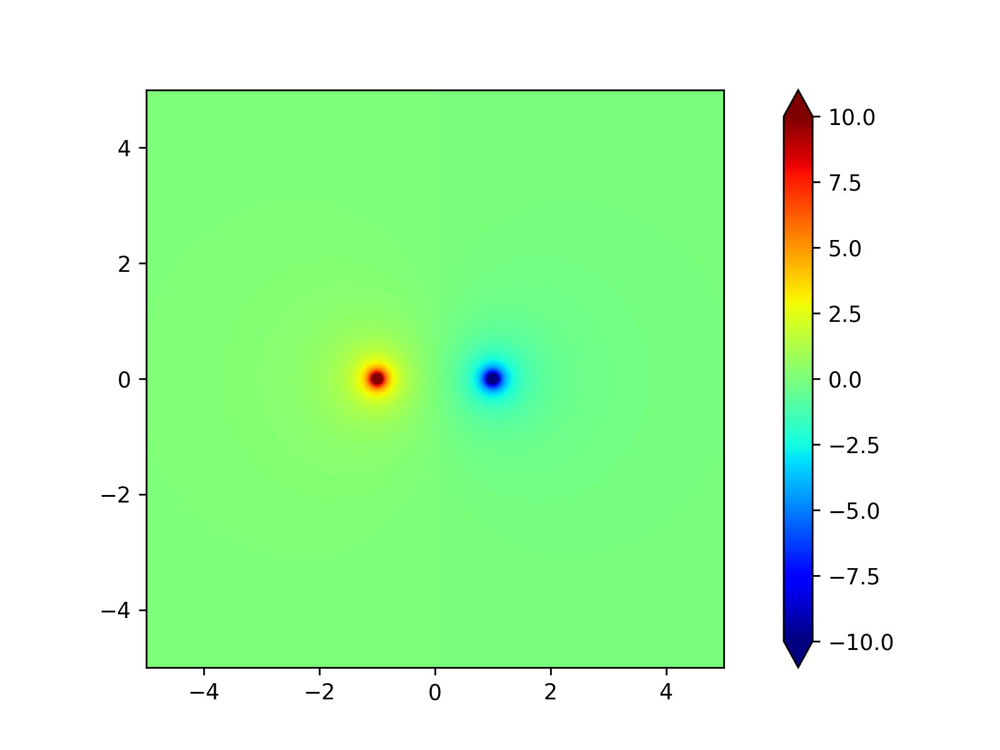

<AxesSubplot:>

In [6]:
# Draw a slice through the potential.
z0 = 0.0
ed.draw_scalar_field(X,Y,Z,V,z0, cutoff=10)

## Integrals

When you first learned what an integral was, you probably learned about a one dimensional integral of a function of just one variable: $\int dx \, f(x)$.  In electrodynamics, we have three dimensions, so all of our functions have three variables: $V(x,y,z)$, $\vec{E}(x,y,z)$.  What's more, some of the fields we work with are vector fields, so they have three components.  We can integrate these fields over lines, surfaces, or volumes.

Let's look at some of the useful integrals we can create.

## Line Integral

A familiar operation from vector calculus is the line integral.  We use it in classical mechanics to calculate the work required to move a system from point A to point B:

$$W = \int_{A}^{B} d\vec{s} \cdot \vec{F}$$

We can generalize the idea of the line integral to any vector field.  Let's explore this concept for the electric field of two charges.

<IPython.core.display.Javascript object>


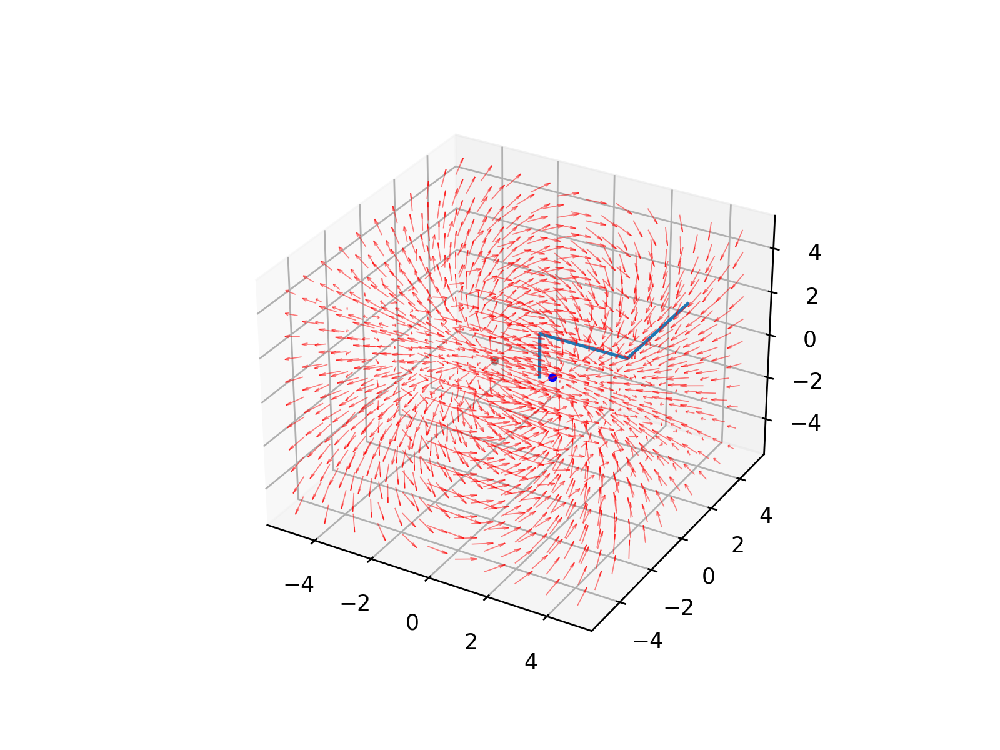

The contour integral is 0.036314188005131504


In [18]:
# Define a path.
x0 = 0
y0 = 1
z0 = -1

# Initial position.
P0 = np.array([x0,y0,z0])

# Use unit vectors to define the displacement.
dx = 3 * vc.eX
dy = 4 * vc.eY
dz = 2 * vc.eZ

# Move to endpoint in steps along a single axis.
P1 = P0 + dz
P2 = P1 + dx
P3 = P2 + dy

# Assemble the points into a list.
points = [P0, P1, P2, P3]

# Compute the contour integral.
W = vc.path_integral(E, points, *grid)

# Draw the electric field and the path.
ax = vc.draw_path(E, points, *grid)

# Indicate location of charges in plot.
ax.scatter3D(*list(zip(R1,R2)),c=['k','b'], s=9)

# Display the result.
print("The contour integral is", W)

By changing the order of the steps (dx, dy, dz) you can generate six different paths between the starting and ending point.  Do this.  What range of values do you observe for the different paths?

xyz:0.028481211945132603

xzy:0.038437062825041224

yxz:0.028576631593941047

yzx:0.028481211945132603

zyx:0.028481211945132603

zxy:0.036314188005131504

The contour range for these six paths has a minimum value of 0.02848, and a maximum value of 0.03843.

Create a path with at least 6 points.  Plot it here.

<IPython.core.display.Javascript object>


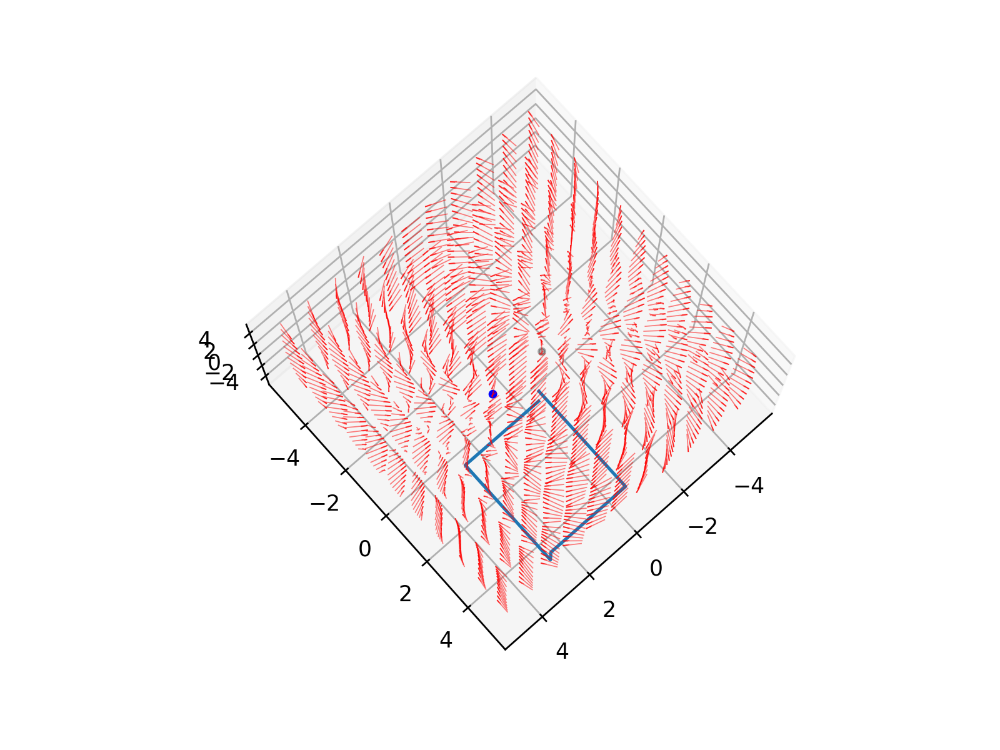

The contour integral is 0.007928395708807344


In [22]:
# Define a path.
x0 = 0
y0 = 1
z0 = -1

# Initial position.
P0 = np.array([x0,y0,z0])

# Use unit vectors to define the displacement.
dx = 3 * vc.eX
dy = 4 * vc.eY
dz = 2 * vc.eZ

# Move to endpoint in steps along a single axis.
P1 = P0 + dx
P2 = P1 + dy
P3 = P2 + dz
P4 = P3 - dx
P5 = P4 - dy



# Assemble the points into a list.
points = [P0, P1, P2, P3, P4, P5]

# Compute the contour integral.
W = vc.path_integral(E, points, *grid)

# Draw the electric field and the path.
ax = vc.draw_path(E, points, *grid)

# Indicate location of charges in plot.
ax.scatter3D(*list(zip(R1,R2)),c=['k','b'], s=9)

# Display the result.
print("The contour integral is", W)

## Circulation

If the contour for a line integral starts and ends on the same point, its value is called the **circulation** of the vector field, sometimes given the symbol $\Gamma$:

$$\Gamma = \oint d\vec{s} \cdot \vec{E}$$

The "O" on the integral sign is to indicate that the path is actually a closed loop.

<IPython.core.display.Javascript object>


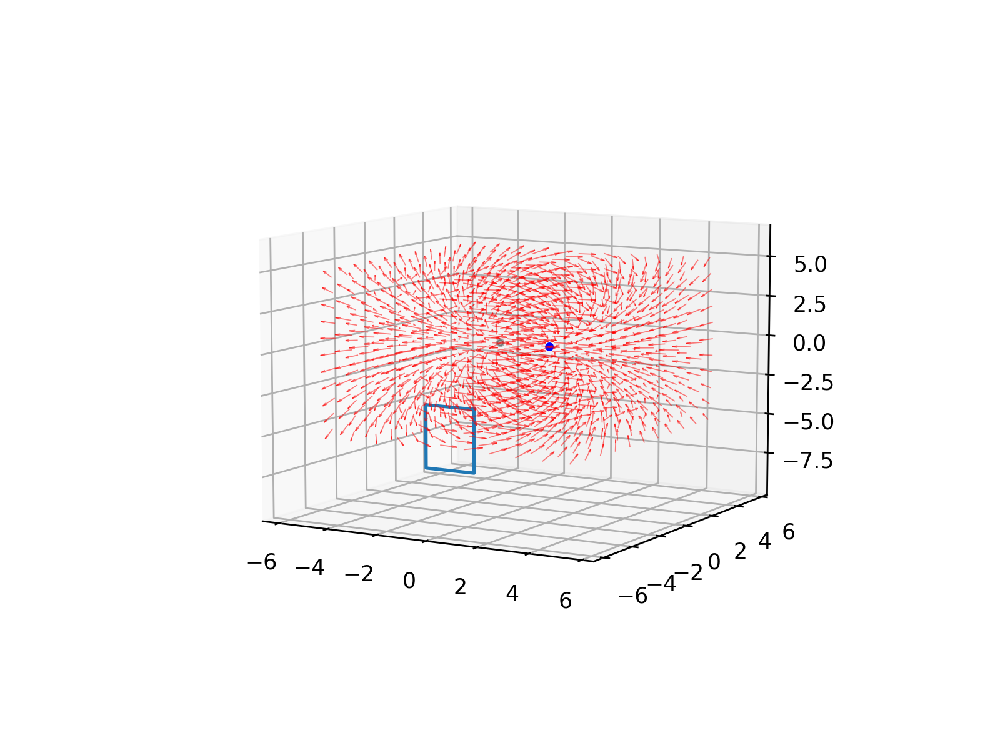

The circulation integral is -0.0002431972496946041


In [32]:
# Define a path.
x0 = -1.5
y0 = -1
z0 = -4

# Initial position.
P0 = np.array([x0,y0,z0])

# Use unit vectors to define the displacement.
dx = 2 * vc.eX
dy = 3 * vc.eY
dz = 4 * vc.eZ

# Move to endpoint in steps along a single axis.
P1 = P0 - dz
P2 = P1 - dx
P3 = P2 + dz
P4 = P3 + dx

# Assemble the points into a list.
points = [P0, P1, P2, P3, P4]

# Compute the circulation.
Gamma = vc.path_integral(E, points, *grid)

# Draw the electric field and the path.
ax = vc.draw_path(E, points, *grid)

# Indicate location of charges in plot.
ax.scatter3D(*list(zip(R1,R2)),c=['k','b'], s=9)

# Display the result.
print("The circulation integral is", Gamma)

Move the loop around and change its size and orientation by modifying the code above.  You can try adding more points if you would like.

Compute the circulation for at least 6 different contours.  What range of values do you observe?

+x+z-x-z =  0.015267796445014858

+z+x-z-x = -0.016057086955965402

+x-z-x+z =  0.00018335891989230274

+z-x-x+z = -0.0029350446659469082

-x-z+x+z =  0.0002431972496946041

-z-x+z+x = -0.0002431972496946041

The ciculation integral range for these six contours has a minimum value of -0.016057, and a maximum value of 0.01526. I'm not sure if the it's a problem if the circulation leaves the range of the field...

## Flux

A **flux** is often defined as an amount of *something* passing through a surface per unit time: energy, charge, mass, volume of fluid, etc.  However, the mathematical concept is more general.  We can compute the flux of *any* vector field through *any* surface.  The resulting quantity is often given the symbol $\Phi$.

$$\Phi = \int d\vec{A} \cdot \vec{E}$$

$d\vec{A}$ is an **area element** whose direction is perpendicular to the surface.  When the surface is closed, we indicate this with a modified integral sign.

$$\Phi = \oint d\vec{A} \cdot \vec{E}$$

Gauss' law is an example of flux through a closed surface.

<IPython.core.display.Javascript object>


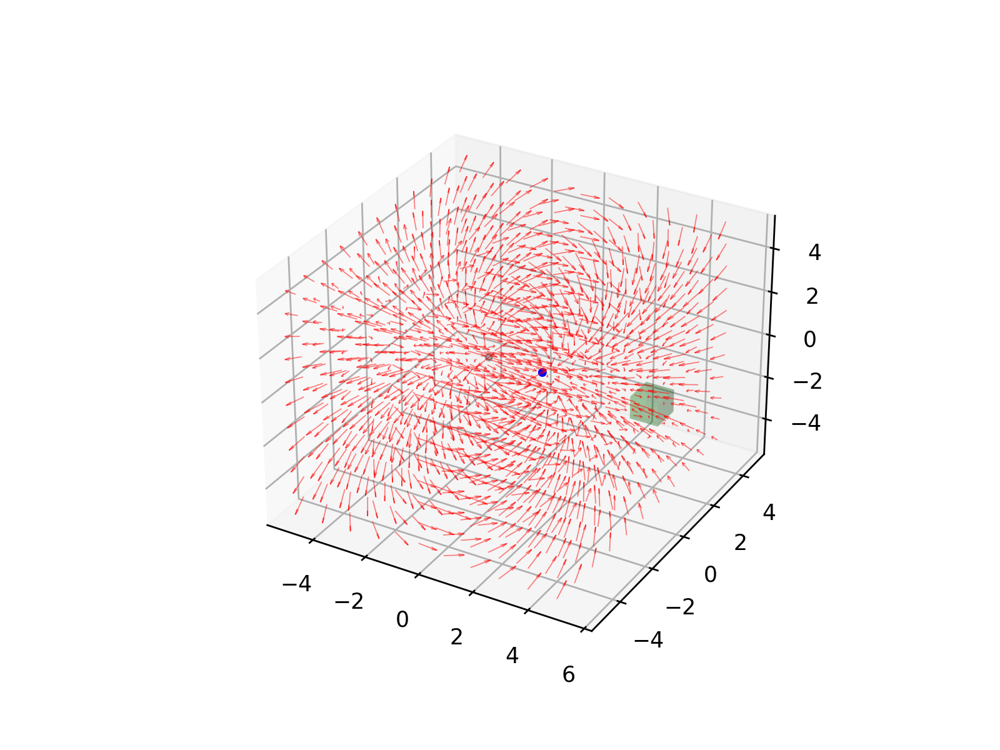

The flux through the box is -0.0002455496226664317


In [60]:
# Define rectangular box for computing flux.
# Coordinates of center.
xC = 5
yC = 0
zC = 0

# Lenth of sides.
dX = 1
dY = 1
dZ = 1

# Bottom, front, left corner, required by flux and plotting functions.
P0 = np.array([xC, yC, zC]) - np.array([dX,dY,dZ]) / 2

# Compute the flux.
Phi = vc.flux(E, P0, dX, dY, dZ, *grid)

# Draw the box and the field.
ax = vc.draw_box(E, P0, dX, dY, dZ, *grid)

# Indicate location of charges in plot.
ax.scatter3D(*list(zip(R1,R2)),c=['k','b'], s=9)

# Display the result.
print("The flux through the box is", Phi)

Explore the flux of this electric field.  Move the box around and change its shape by modifying the code above.

What range of values do you observe when ***no charges are in the box***?

When no charges are in the box, the range varies from a min of -0.0011474598421857577 to a max of -0.00018958865355148992

What range of values do you observe when ***only one charge is in the box***?

When only the negative charge is in the box, the range varies from a min of -12.56325264599279 to a max of -12.548879990462778

What range of values do you observe when ***both charges are in the box***?

When both charges are in the box, the range varies from 0.010241102261600774 to 0.18398598429743418

## Derivatives

When you first learned about derivatives, as with integrals, you probably learned about the rate of change of a scalar function of a single variable: $\dfrac{df}{dx}$.

In mechanics, we also use derivatives of vector funcations: $\vec{v}(t) = \dfrac{d\vec{r}}{dt}$.

There are more possibilities for derivatives in three dimensions, especially when working with vector fields.  We will see three kinds of derivatives quite often in this course.

## Gradient

You may already be familiar with the gradient from an earlier physics course.  We can't simply "take the deriviative of a function" in three dimensions.  We need to specify a direction first.  The gradient is special, because it gives the direction of **steepest ascent** — the direction in which a function changes most rapidly at a particular point in space.  (If the function happens to give the height as a function of position, then the gradient points directly uphill.)

The gradient of a scalar function is defined as a collection of derivatives:
$$
\mathbf{grad}(f) = \nabla f = \dfrac{\partial f}{\partial x} \, \mathbf{e}_x
        + \dfrac{\partial f}{\partial y} \, \mathbf{e}_y
        + \dfrac{\partial f}{\partial z} \, \mathbf{e}_z
$$

In [78]:
# Define a function in 3D.
f = np.exp(-X**3 - Y**3 - Z**3)

# Compute its gradient.
df = vc.grad(f,ds)

<IPython.core.display.Javascript object>


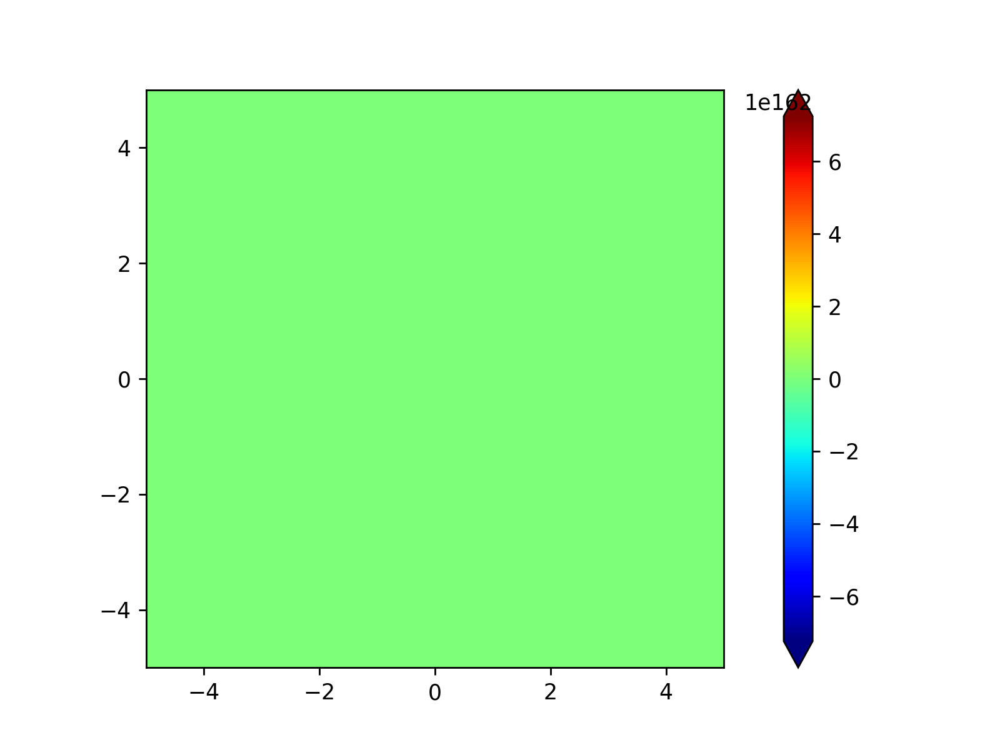

<IPython.core.display.Javascript object>


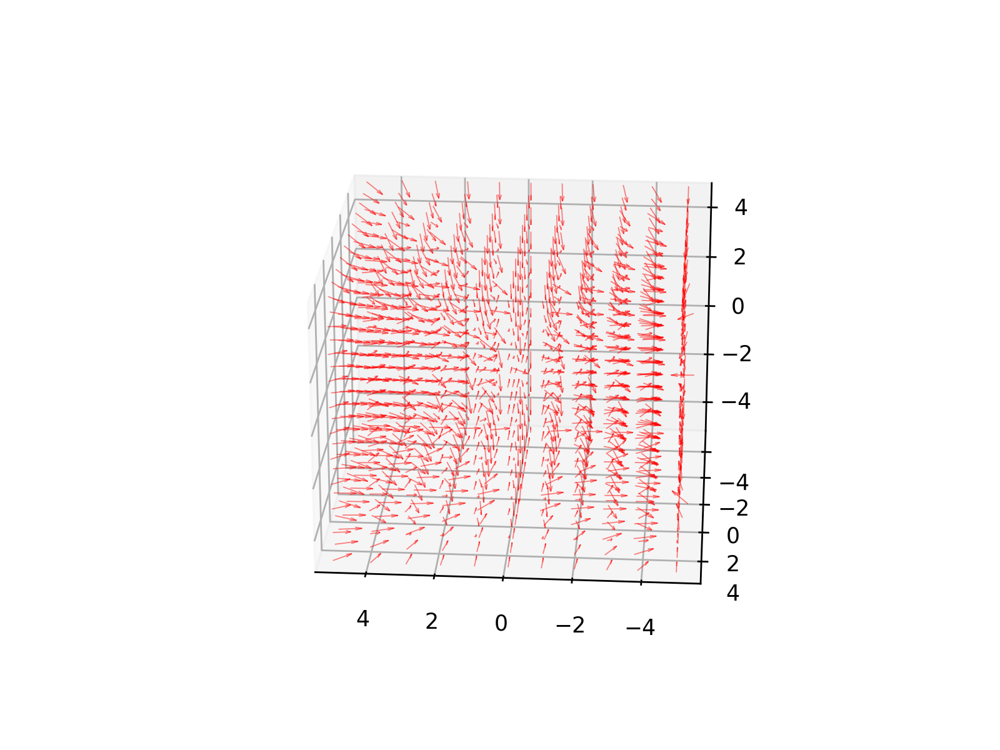

C:\Users\jdkob\anaconda3\lib\site-packages\numpy\linalg\linalg.py:2560: RuntimeWarning: overflow encountered in multiply
  s = (x.conj() * x).real


<Axes3DSubplot:>

In [79]:
# Draw a slice of the function.
ed.draw_scalar_field(X,Y,Z,f, cutoff=f.max())

# Draw the resulting vector field.
ed.draw_vector_field(X,Y,Z,*df)

Compare the vector field to the scalar field.  Do the arrows make sense as a direction of steepest ascent?  Explain why or why not.

The arrows pointing to the center in the vector field make sense as the scalar field shows the center of the field changing the fastest.

Change the definition of $f(x,y,z)$ to plot some other functions of your choosing.  Maybe try for something with ripples ...

What are your observations about the relation of the gradient to the starting function?

After changing the function from a square function to a cubed function, the scalar field no longer shows any major area of change, while the vector field varies on where it points to the steepest ascent. THis makes sense as the signs are alternatiting from negative to postive. 

**Note:** Notice that the gradient maps a scalar field to a vector field.  It is possible to take the gradient of a vector field, but the resulting object is called a ***tensor***.  In three dimensions, it has 9 components and can be interpreted as a kind of ***matrix-valued function*** at every point in space.  These are difficult to plot!

When we take the derivative of a vector field $\vec{F}(x,y,z)$, there are 9 possible derivatives:
$$
\dfrac{\partial F_x}{\partial x},
\dfrac{\partial F_x}{\partial y},
\dfrac{\partial F_x}{\partial z},
\dfrac{\partial F_y}{\partial x},
\dfrac{\partial F_y}{\partial y},
\dfrac{\partial F_y}{\partial z},
\dfrac{\partial F_z}{\partial x},
\dfrac{\partial F_z}{\partial y},
\dfrac{\partial F_z}{\partial z},
$$

It turns out that two combinations of these derivatives are all that is required for electrodynamics!  One combination, called the **divergence** produces a scalar field.  The other, called the **curl** produces another vector field.

## Divergence

The divergence of a vector field $\vec{F}(x,y,z)$ is defined as
$$\mathbf{div}(\vec{F}) = \nabla \cdot \vec{F} = 
\dfrac{\partial F_x}{\partial x} + 
\dfrac{\partial F_y}{\partial y} +
\dfrac{\partial F_z}{\partial z}
$$

In [97]:
# Define a vector field.
Fx = X**2 + Y**2#X**2 * Y**2
Fy = X**2 + Y**2#X*Y*Z**2
Fz = X**2 + Y**2#X*2 + Y*2
F = np.stack([Fx, Fy, Fz])

# Compute the divergence.
dF = vc.div(F,ds)

<IPython.core.display.Javascript object>


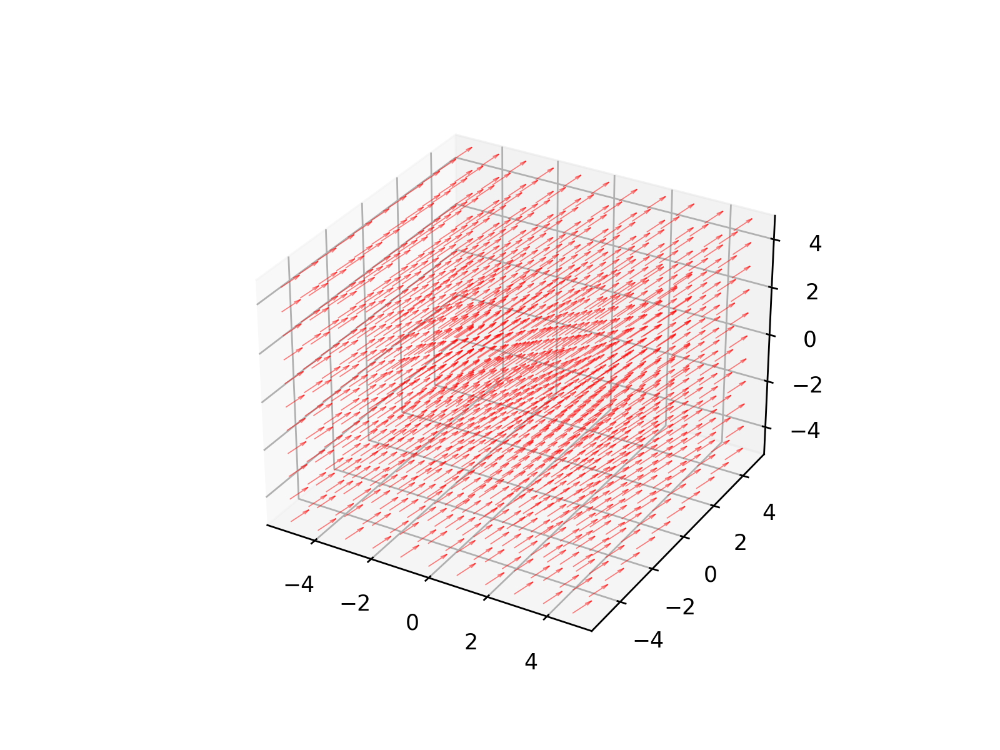

<IPython.core.display.Javascript object>


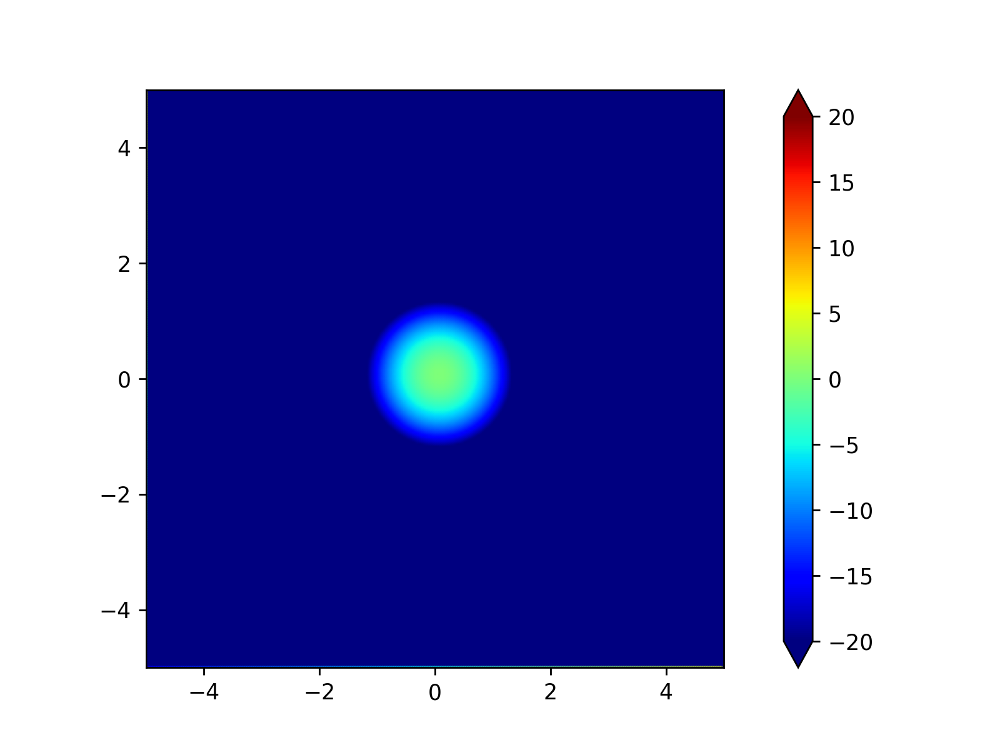

<AxesSubplot:>

In [105]:
# Plot the vector field.
ed.draw_vector_field(X,Y,Z,*F)

# Plot the divergence.
z0 = 5
ed.draw_scalar_field(X,Y,Z,dF,z0)

Compare the vector field to the scalar field.  Can you identify any correlations between the scalar field and the vector field?

It's very difficult to see any correlation as so many vectors overlap each other, and since there are both positive and negative areas of steepest ascent.  

Try looking at different slices of the divergence.  Try changing the definition of the vector field.  Describe your efforts and observations.

Taking a slice when z0 = 5 makes the center of the scalar field the area of steepest ascent, which can be seen easier than a slice from the center. Changing the function to "X**2 + Y**2" for Fx, Fy, and Fz makes the vector field point in one general direction, and a slice from the center looks like a diagonal rainbow with even change in steepness. Although when taking different slices from the center to the top, the intensity stays the same until a slice is taken from z0 = 5, which only shows a mostly negative plane with a circular less negative center.

According to Maxwell's equations, the divergence of the electric field is related to the charge density ...

In [119]:
# Compute the divergence of the electric field.
dE = vc.div(E,ds)

<IPython.core.display.Javascript object>


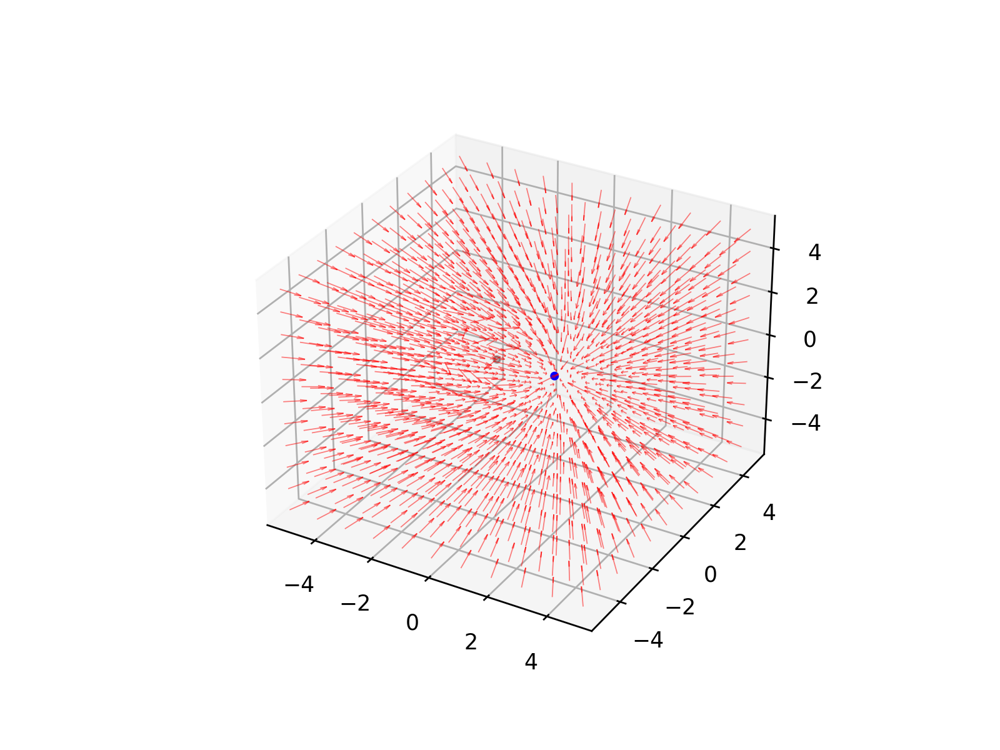

<IPython.core.display.Javascript object>


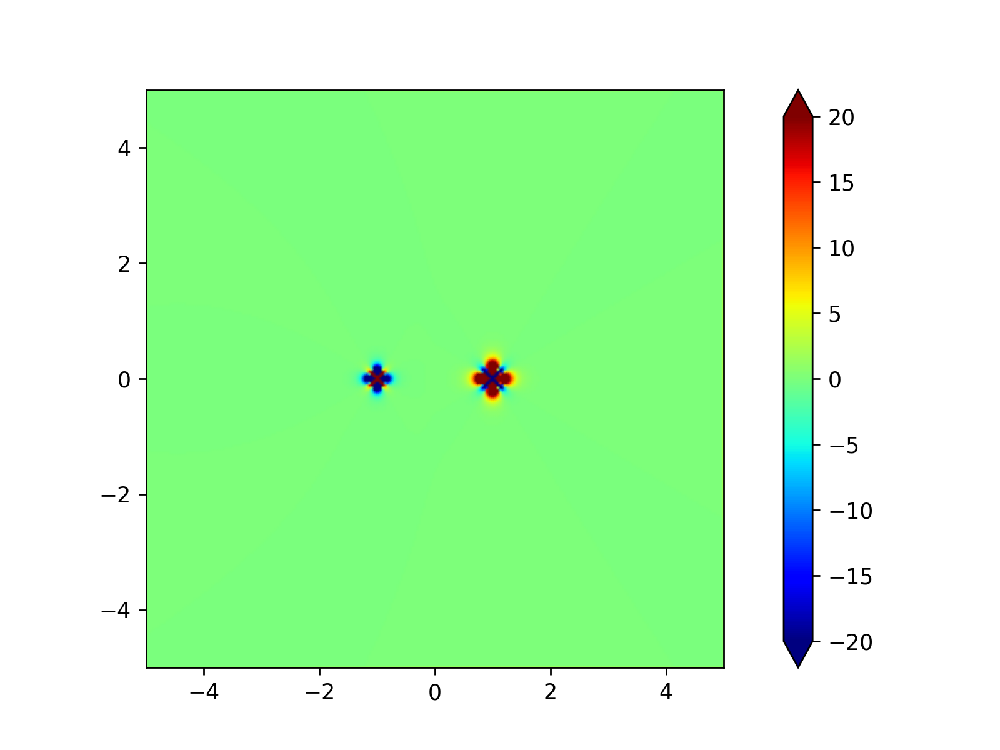

<AxesSubplot:>

In [120]:
# Plot the vector field ...
ax = ed.draw_vector_field(X,Y,Z,*E)

# ... with charges.
ax.scatter3D(*list(zip(R1,R2)),c=['k','b'], s=9)

# Plot the divergence.
ed.draw_scalar_field(X,Y,Z,dE)

What kind of correlation do you see between the electric field and its divergence?

It seems that the divergence shows that the electric field is strongest near the charges and pretty much zero everywhere else. 

Change the charges and their locations, and then recompute the field and its divergence.  Describe your efforts and the results.

When both charges are positive, the only difference is that the negative charge now looks like the positive charge, but doesn't affect the rest of the slice. I thought since the electric field was mainly going outward the rest of the slice would change dramatically. Increasing the negative charge from 1 to 5 only slighly increased the size of the negative charge. 

## Curl

The other combination of derivatives that shows up frequently in physics is called the **curl** of a vector field.  It is another vector field, whose components are particular combinations of derivatives.

$$
\mathbf{curl}(\vec{F}) = \nabla \times \vec{F} =
\left(\dfrac{\partial F_z}{\partial y} - \dfrac{\partial F_y}{\partial z}\right) \, \mathbf{e}_x +
\left(\dfrac{\partial F_x}{\partial z} - \dfrac{\partial F_z}{\partial x}\right) \, \mathbf{e}_y +
\left(\dfrac{\partial F_y}{\partial x} - \dfrac{\partial F_x}{\partial y}\right) \, \mathbf{e}_z
$$

In [125]:
# Define a vector field.
Fx = X
Fy = Y
Fz = Z
F = np.stack([Fx, Fy, Fz])

# Compute the curl.
dF = vc.curl(F,ds)

<IPython.core.display.Javascript object>


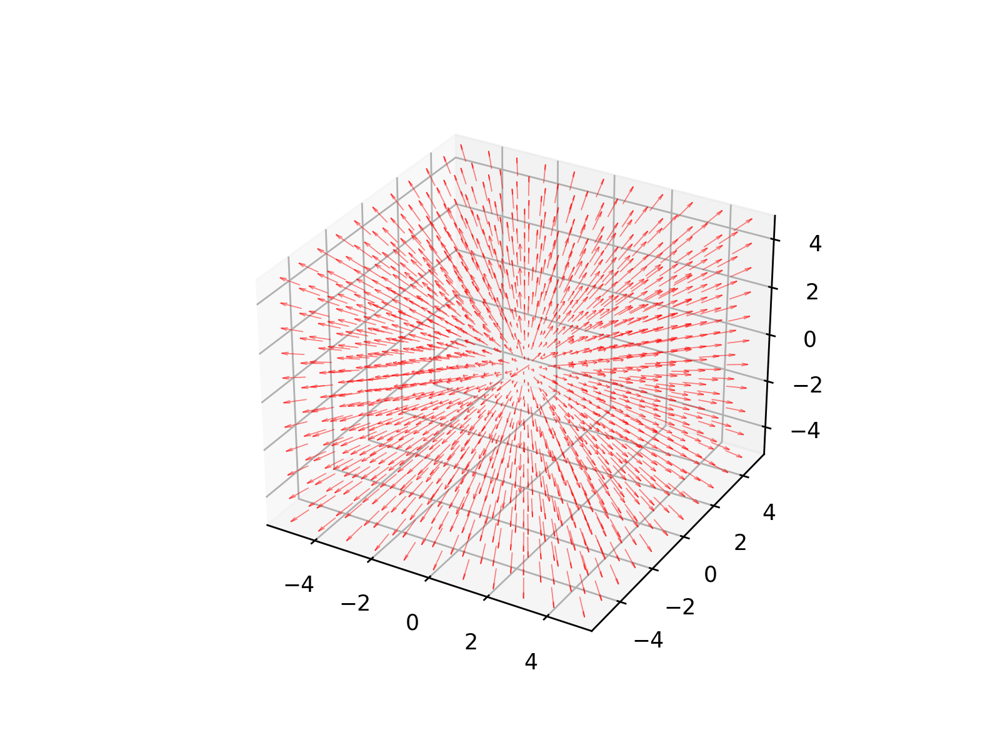

<IPython.core.display.Javascript object>


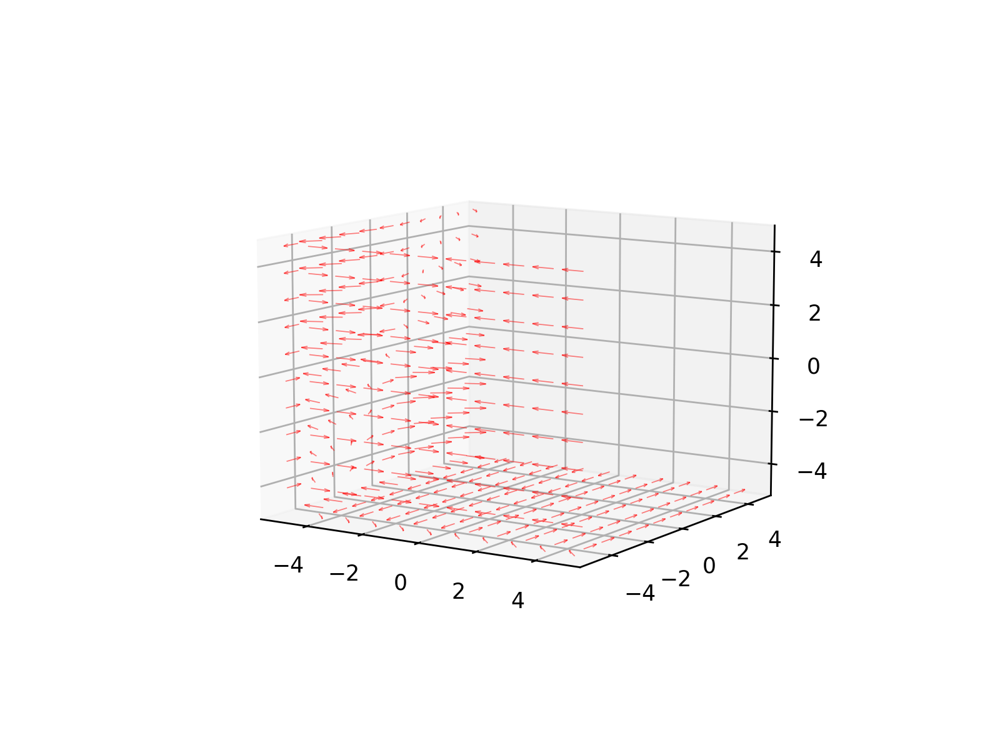

<Axes3DSubplot:>

In [126]:
# Plot the vector field.
ed.draw_vector_field(X,Y,Z,*F)

# Plot the curl.
ed.draw_vector_field(X,Y,Z,*dF)

It can be hard to make sense of the mass of arrows, but give it a try.  (You can reduce the number of arrows in a plot using the `stride` keyword ...)

What patterns or correlations do you notice between the arrows in the original vector field and those in its curl?

The arrows in the original field looks like a symetrical upward swirl, while the arrows in the curl only seem to make a wave-like pattern on the -x side wall.

Try changing the definition of the vector field.  Describe your efforts and observations with other functions.  What was special about the original function?

Changing the function to match each variable to itself (e.g. Fx = X) make the vector field point outward as expected, but the curl field only shows arrows on the far negative walls of the plot. I believe the orignal function seemed special as the Fx was assigned to Y, while Fy was assigned to X.

## Combinations

Just as we can take second derivatives in calculus, we can combine the vector derivative operations.  Play around with the following.  Change the function definitions, and try to deduce patterns or special cases that seem interesting.

### Divergence of a Gradient

The divergence of the gradient of a function is also called the **laplacian** of the function:
$$\mathbf{div}(\mathbf{grad}(f)) = \nabla \cdot \nabla f = \nabla^2 f$$

In [127]:
# Define a function in 3D.
f = np.exp(-X**2 - Y**2 - Z**2)

# Compute the divergence of the gradient.
ddf = vc.div(vc.grad(f,ds),ds)

<IPython.core.display.Javascript object>


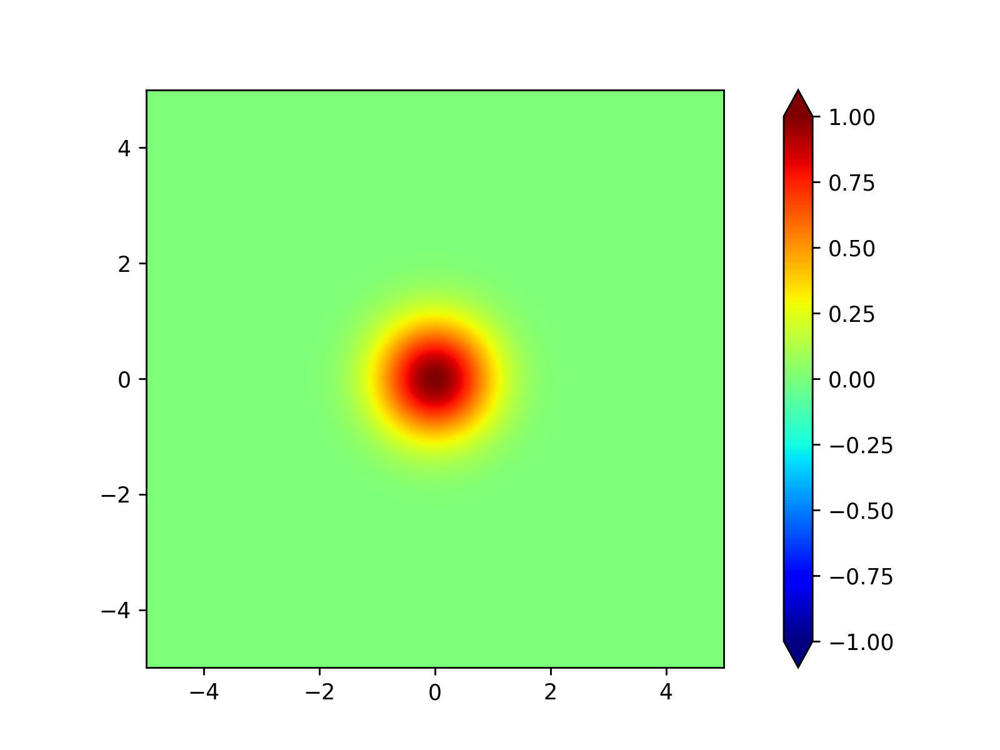

<IPython.core.display.Javascript object>


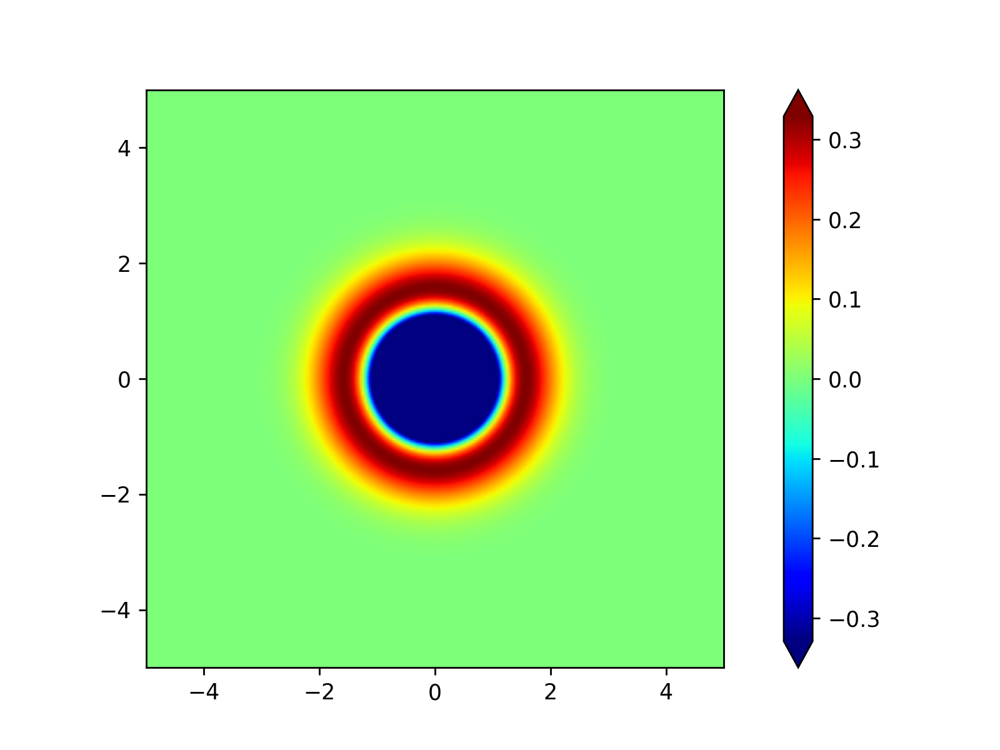

<AxesSubplot:>

In [128]:
# Draw a slice of the function.
ed.draw_scalar_field(X,Y,Z,f, cutoff=f.max())

# Draw a slice of div-grad-f.
ed.draw_scalar_field(X,Y,Z,ddf, cutoff=ddf.max())

### Curl of a Gradient

The curl of the gradient is defined as
$$\mathbf{curl}(\mathbf{grad}(f)) = \nabla \times \nabla f$$

This operation has no special name.  Can you see why?

In [129]:
# Define a function in 3D.
f = np.exp(-X**2 - Y**2 - Z**2)

# Compute the curl of the gradient.
ddf = vc.curl(vc.grad(f,ds),ds)

<IPython.core.display.Javascript object>


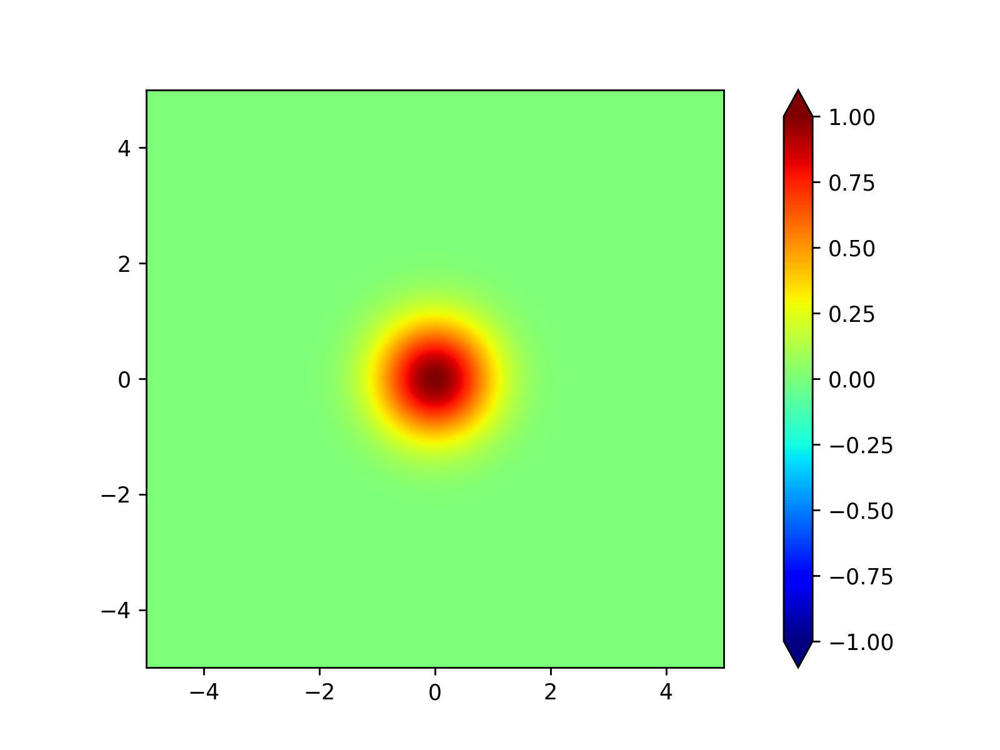

<IPython.core.display.Javascript object>


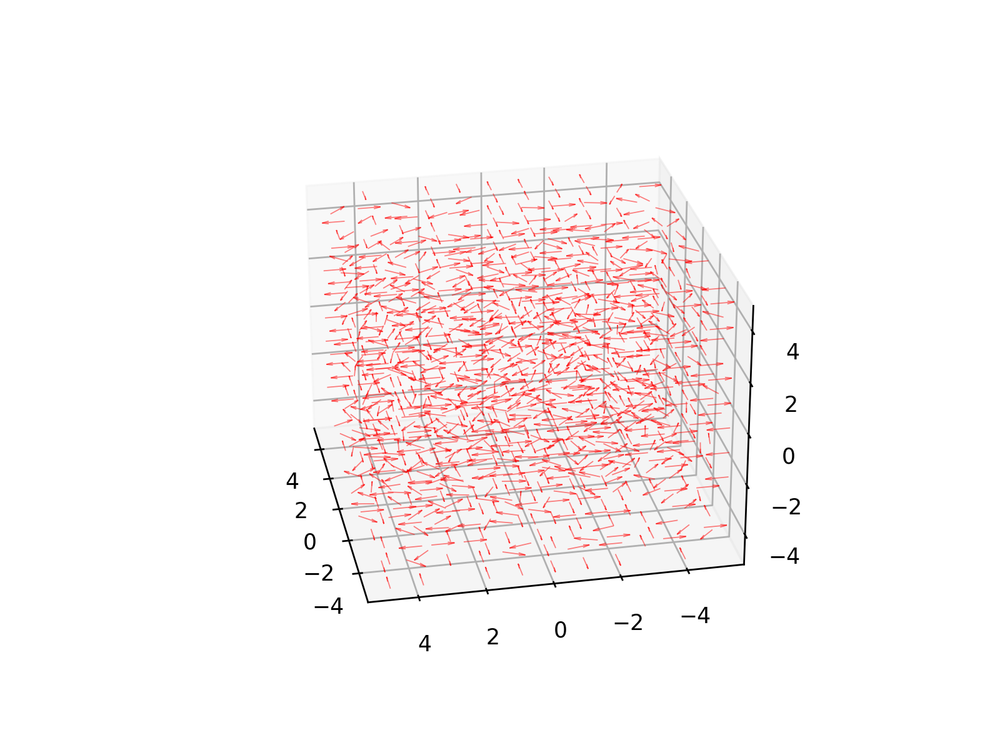

<Axes3DSubplot:>

In [130]:
# Draw a slice of the function.
ed.draw_scalar_field(X,Y,Z,f, cutoff=f.max())

# Draw the vector field.
ed.draw_vector_field(X,Y,Z,*ddf)

<IPython.core.display.Javascript object>


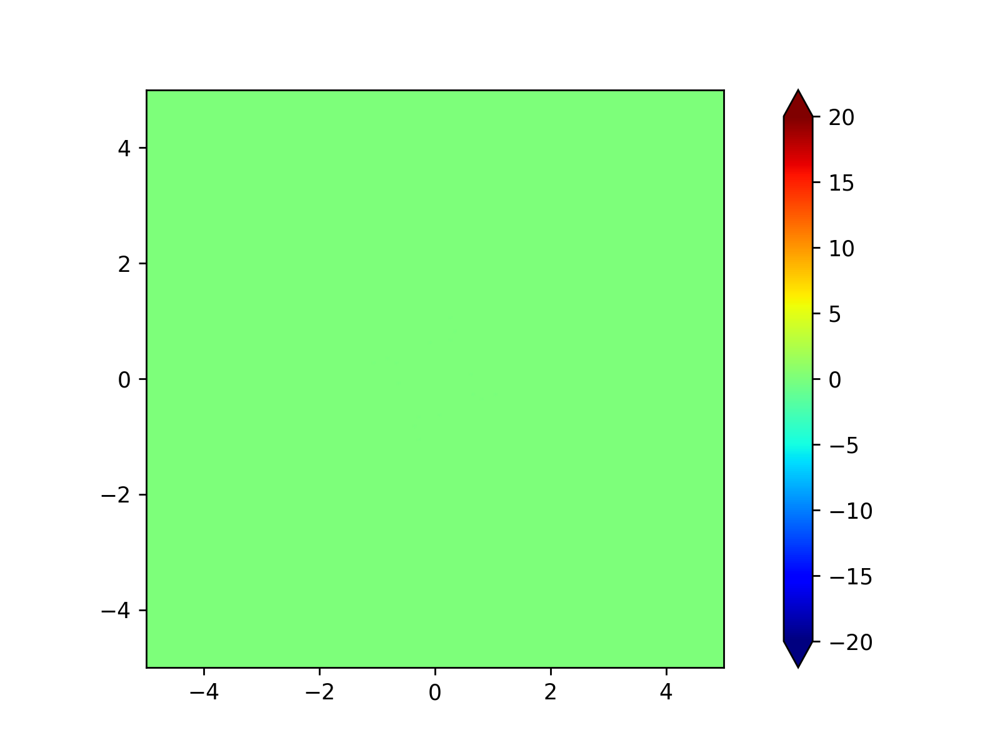

<IPython.core.display.Javascript object>


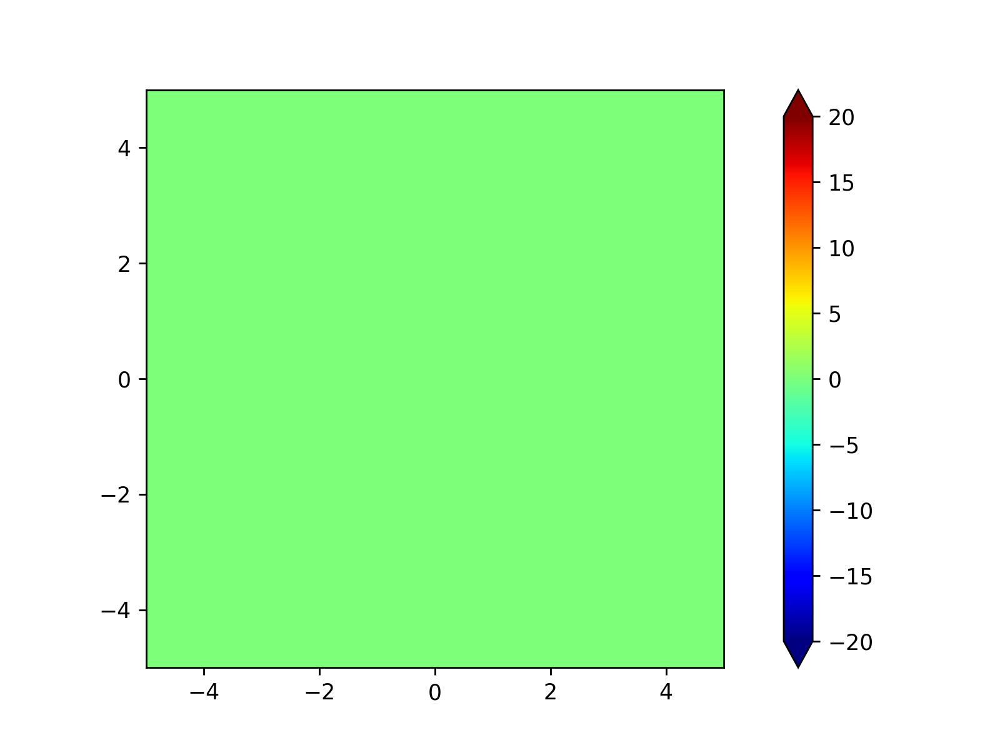

C:\Users\jdkob\Documents\PHY Elec & Mag\electrodynamics\week-02\Electrodynamics.py:107: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(dpi=200)


<IPython.core.display.Javascript object>


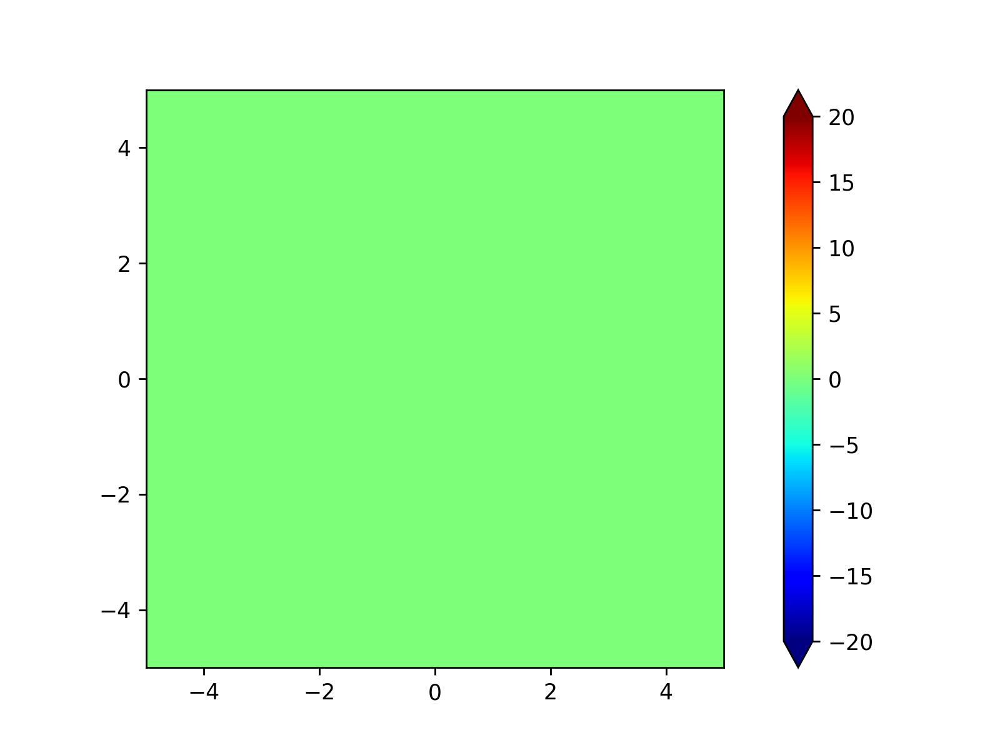

<AxesSubplot:>

In [131]:
# Draw slices through the components of curl-grad-f.
z0 = 0.0
ed.draw_scalar_field(X,Y,Z,ddf[0], z0)  # x-component
ed.draw_scalar_field(X,Y,Z,ddf[1], z0)  # y-component
ed.draw_scalar_field(X,Y,Z,ddf[2], z0)  # z-component

### Curl of a Curl

The curl of the curl of a vector field is defined as
$$\mathbf{curl}(\mathbf{curl}(\vec{F})) = \nabla \times (\nabla \times \vec{F})$$

This operation will appear when we look at electromagnetic waves!

In [132]:
# Define a vector field.
Fx = Z*Y**2
Fy = Z*X**2
Fz = X*Y**2
F = np.stack([Fx, Fy, Fz])

# Compute the curl.
ddF = vc.curl(vc.curl(F,ds),ds)

<IPython.core.display.Javascript object>


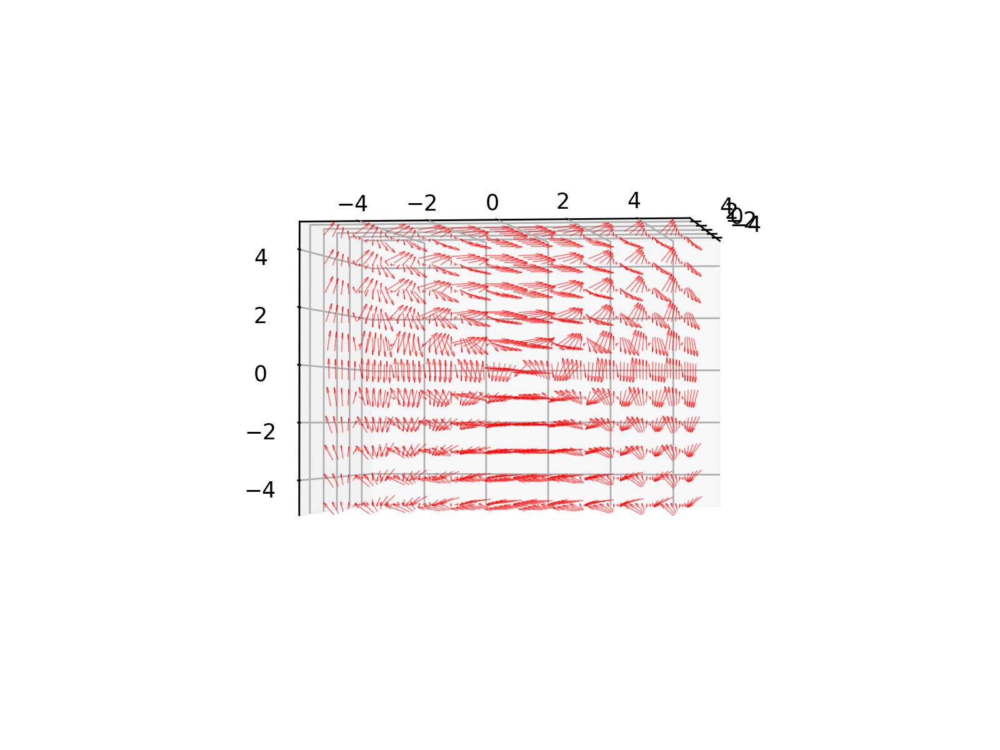

<IPython.core.display.Javascript object>


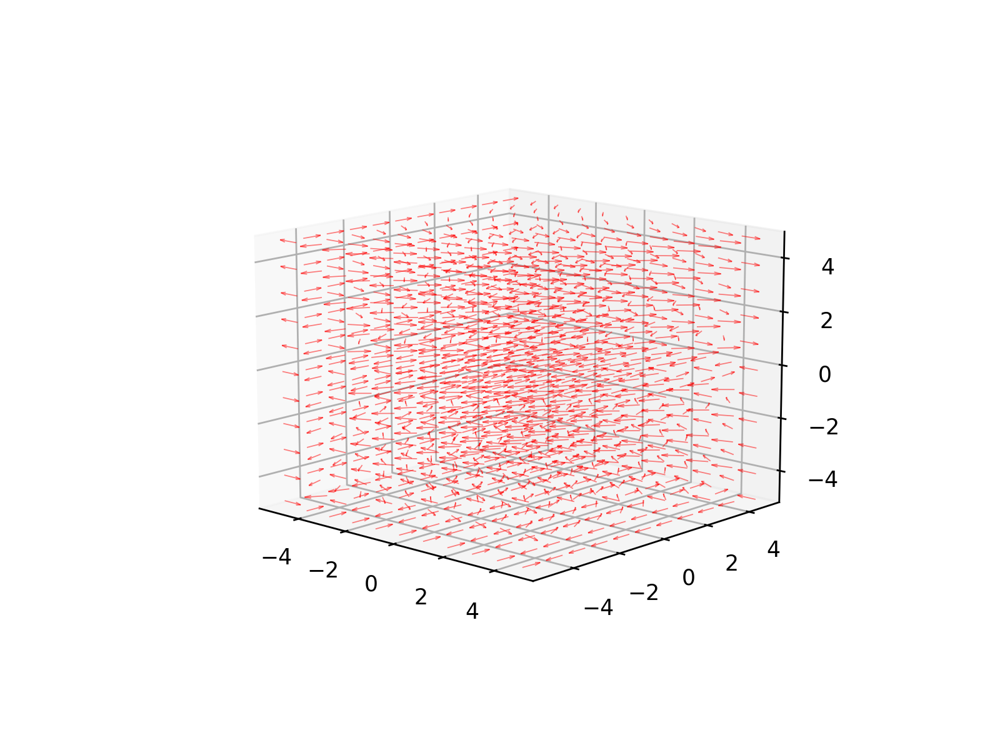

<Axes3DSubplot:>

In [133]:
# Plot the vector field.
ed.draw_vector_field(X,Y,Z,*F)

# Plot the curl-of-the-curl.
ed.draw_vector_field(X,Y,Z,*ddF)

<IPython.core.display.Javascript object>


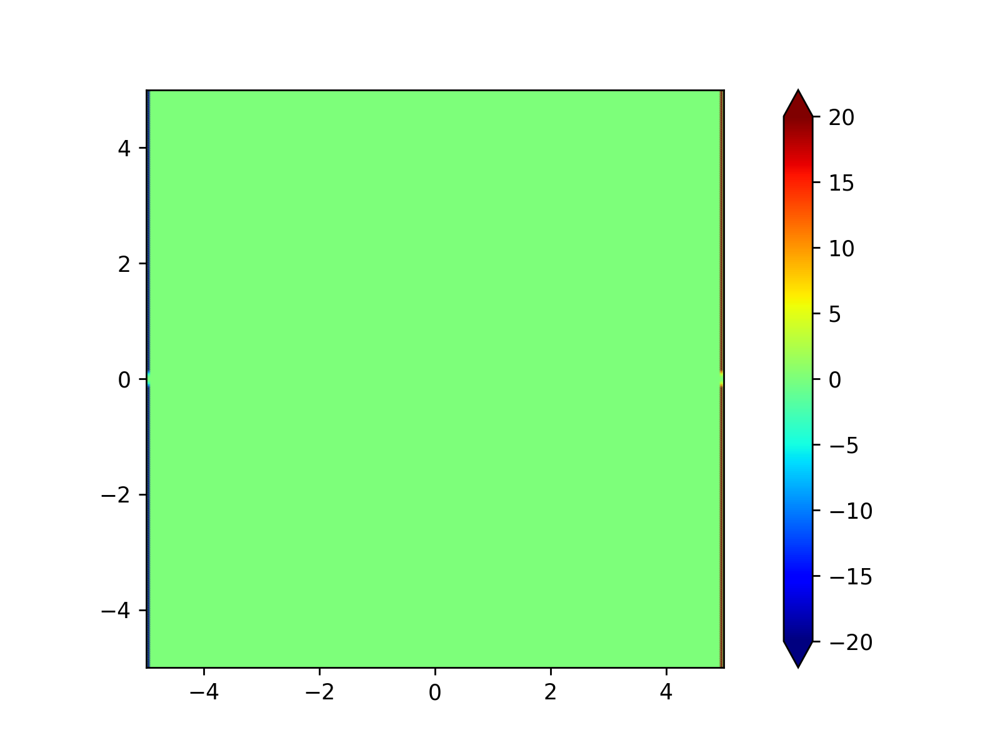

<IPython.core.display.Javascript object>


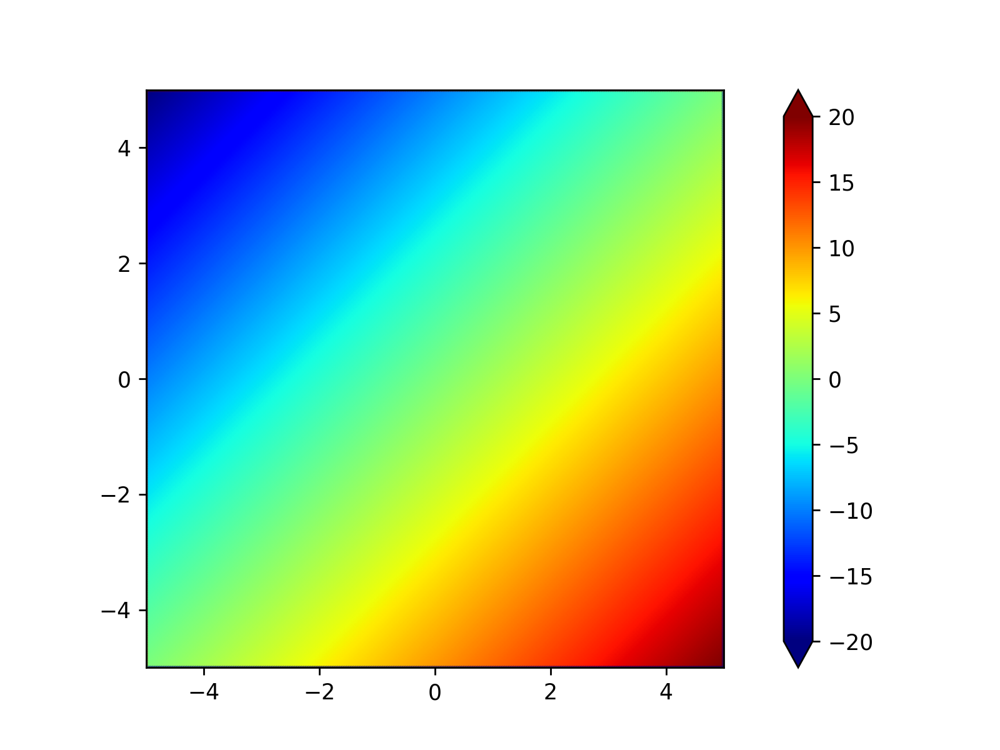

<IPython.core.display.Javascript object>


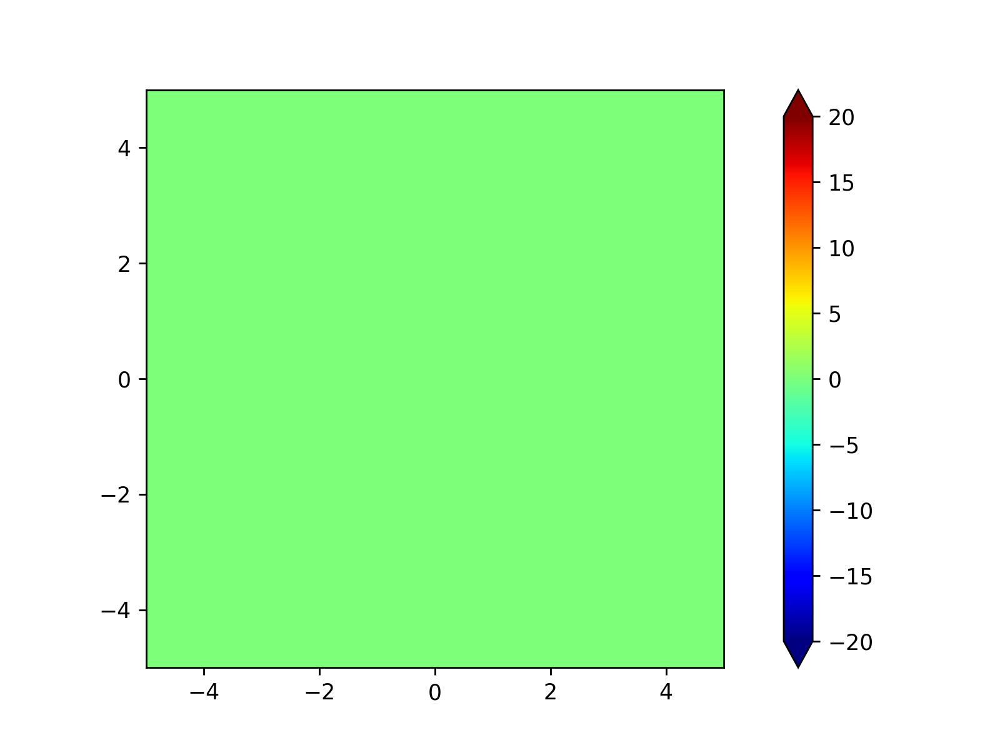

<AxesSubplot:>

In [134]:
# Draw slices through the components of curl-curl-f.
z0 = 0.0
ed.draw_scalar_field(X,Y,Z,ddF[0], z0)  # x-component
ed.draw_scalar_field(X,Y,Z,ddF[1], z0)  # y-component
ed.draw_scalar_field(X,Y,Z,ddF[2], z0)  # z-component

### Divergence of a Curl

The divergence of the curl is written as
$$\mathbf{div}(\mathbf{curl}(\vec{F})) = \nabla \cdot (\nabla \times \vec{F})$$

This one has no special name either ...

In [135]:
# Define a vector field.
Fx = Z*Y**2
Fy = Z*X**2
Fz = X*Y**2
F = np.stack([Fx, Fy, Fz])

# Compute the curl.
ddF = vc.div(vc.curl(F,ds),ds)

<IPython.core.display.Javascript object>


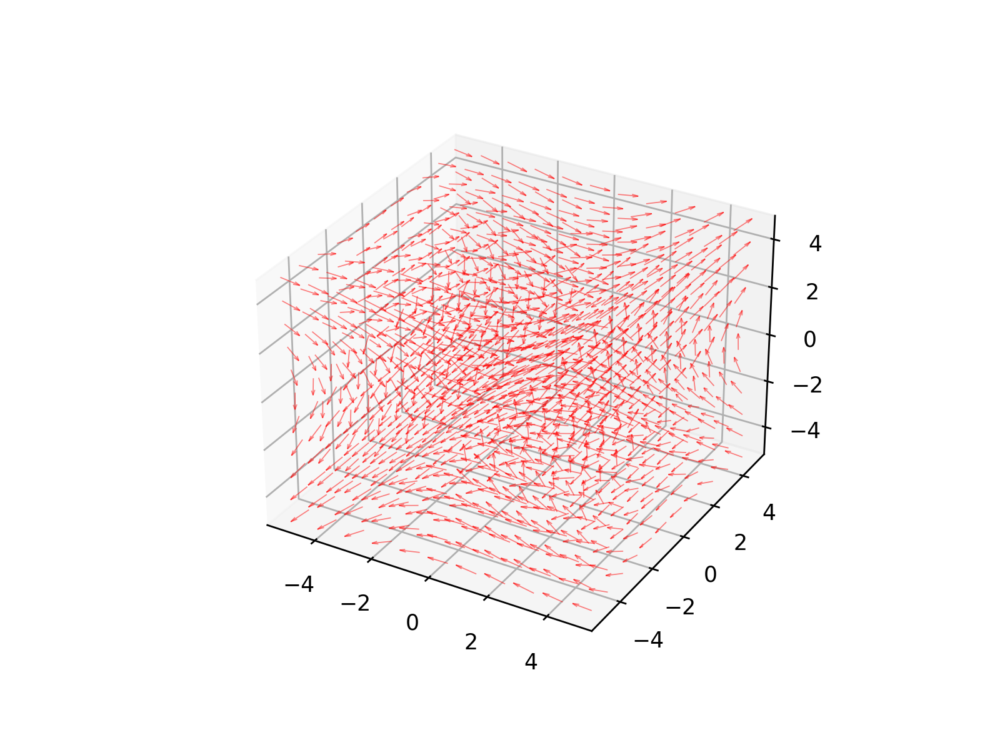

<IPython.core.display.Javascript object>


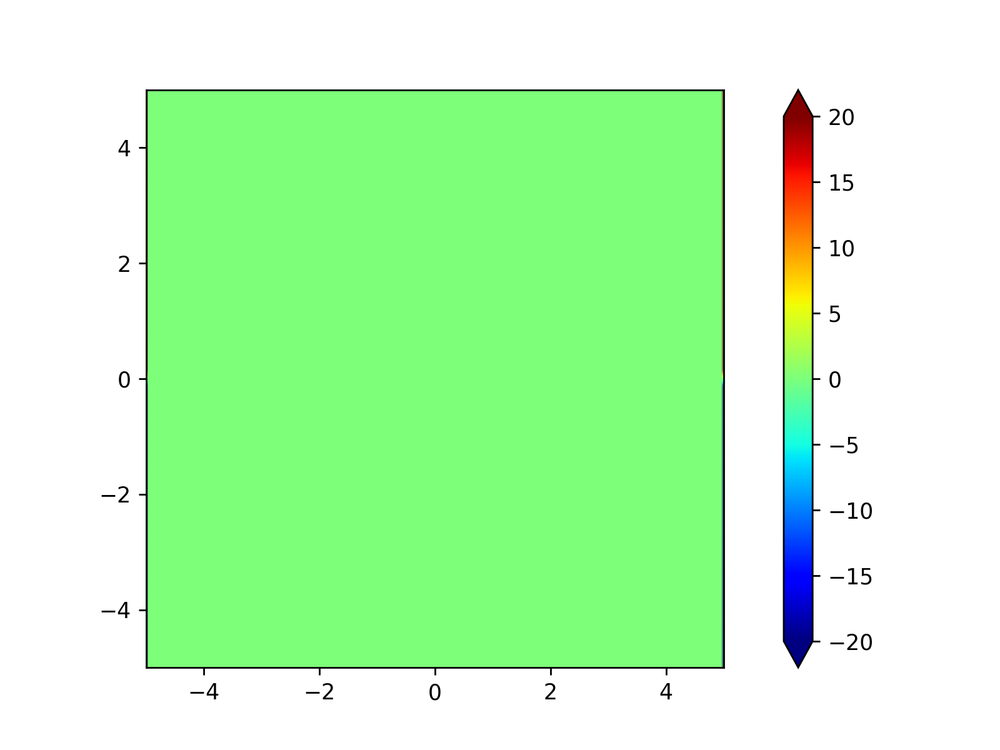

<AxesSubplot:>

In [136]:
# Plot the vector field.
ed.draw_vector_field(X,Y,Z,*F)

# Plot a slice of div-curl-F.
z0 = 0.0
ed.draw_scalar_field(X,Y,Z,ddF, z0)

## Reflection and Summary

Congratulations!  You just completed a crash course in vector calculus!

- What are the major takeaways of this assignment for you?
- What was the most difficult part of this assignment?
- What was the most interesting part of this assignment?
- What questions do you have?

The major takeaways from this assignment was how the vector derivatives effect the electric field as well as the flux contour when enclosing both, one, and none of the point charges.
The most difficult part of this assignment was trying to see the correlation between vector fields and its divergence and curls, especially when the slice taken shows nothing but zero. It was also hard to conceptualize what kind of functions would produce what kind of fields. 
However, the most interesting was seeing the swirl patterns and the combination of vector derivatives.
Does the curl of a gradiant have no name beacuse it produces random results in the field?